In [ ]:
import numpy as np 
!pip install pydicom
import pandas as pd 
from glob import glob
from tqdm import tqdm
import pydicom
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import warnings
warnings.simplefilter("ignore")
%matplotlib inline
from glob import glob
train_img = sorted(glob('/content/drive/MyDrive/ai_for_healthcare_ex2/dicom-images-train/*.dcm'))
test_img = sorted(glob('/content/drive/MyDrive/ai_for_healthcare_ex2/dicom-images-test/*.dcm'))

print(f'Number of train files:{len(train_img)}')
print(f'Number of test files :{len(test_img)}')

df = pd.read_csv('/content/drive/MyDrive/ai_for_healthcare_ex2/train-rle.csv')
print(df.shape)




     |████████████████████████████████| 2.0 MB 5.2 MB/s 
Number of train files:7200
Number of test files :50
(12954, 2)


In [ ]:
def show_imageInfo(dataset):
    print("Filename :", file_path)

    print("Patient's name :", dataset.PatientName.family_name + ", " + dataset.PatientName.given_name)
    print("Patient id :", dataset.PatientID)
    print("Patient's Age :", dataset.PatientAge)
    print("Patient's Sex :", dataset.PatientSex)
    print("Modality :", dataset.Modality)
    print("Body Part Examined :", dataset.BodyPartExamined)
    print("View Position :", dataset.ViewPosition)
    
    if 'PixelData' in dataset:
        rows = int(dataset.Rows)
        cols = int(dataset.Columns)

def plot_pixels(dataset, figsize=(8,8)):
    plt.figure(figsize=figsize)
    plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
    plt.show()

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.10002.1517875220.939397
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

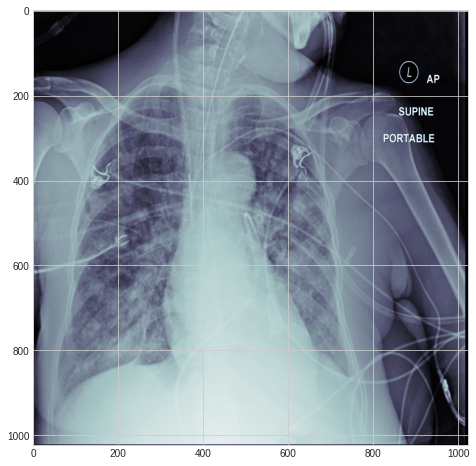

In [ ]:

file_path = train_img[3]
data = pydicom.dcmread(file_path)
print(data)
show_imageInfo(data)
plot_pixels(data)


In [ ]:

missing = 0
multiple = 0
patients_data = []

for k,paths in enumerate(train_img):
    patient = {}
    img_id = paths.split('/')[-1]
    data = pydicom.dcmread(paths)
    try:
        image = df[df['ImageId'] == data.file_meta.MediaStorageSOPInstanceUID]
        
        if image.shape[0] > 1: 
            multiple += 1
        rle = image[' EncodedPixels'].values
        if rle[0] == '-1':
            pixels = rle[0]
        else:    
            pixels = [i for i in rle]
        
        
        patient["UID"] = data.SOPInstanceUID
        patient['EncodedPixels'] = pixels
        patient["Age"] = data.PatientAge
        patient["Sex"] = data.PatientSex
        patient["Modality"] = data.Modality
        patient["BodyPart"] = data.BodyPartExamined
        patient["ViewPosition"] = data.ViewPosition
        patient["filepath"] = paths
        patients_data.append(patient)
    except:
        missing += 1

df_patients = pd.DataFrame(patients_data, columns=["UID", "EncodedPixels", "Age", 
                            "Sex", "Modality", "BodyPart", "ViewPosition", "filepath"])

df_patients['Pneumothorax'] = df_patients['EncodedPixels'].apply(lambda x:0 if x == '-1' else 1)
df_patients['Pneumothorax'] = df_patients['Pneumothorax'].astype('int')

print("images with labels: ", df_patients.shape[0])
df_patients.head(20)

images with labels:  7177


,UID,EncodedPixels,Age,Sex,Modality,BodyPart,ViewPosition,filepath,Pneumothorax
0,1.2.276.0.7230010.3.1.4.8323329.1000.151787516...,-1,38,M,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
1,1.2.276.0.7230010.3.1.4.8323329.10000.15178752...,-1,10,F,CR,CHEST,AP,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
2,1.2.276.0.7230010.3.1.4.8323329.10001.15178752...,-1,50,F,CR,CHEST,AP,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
3,1.2.276.0.7230010.3.1.4.8323329.10002.15178752...,-1,68,F,CR,CHEST,AP,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
4,1.2.276.0.7230010.3.1.4.8323329.10003.15178752...,-1,65,M,CR,CHEST,AP,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
5,1.2.276.0.7230010.3.1.4.8323329.10004.15178752...,-1,45,F,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
6,1.2.276.0.7230010.3.1.4.8323329.10005.15178752...,[209126 1 1019 6 1015 10 1012 13 1010 14 1008 ...,53,F,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,1
7,1.2.276.0.7230010.3.1.4.8323329.10006.15178752...,-1,55,M,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
8,1.2.276.0.7230010.3.1.4.8323329.10007.15178752...,-1,26,F,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0
9,1.2.276.0.7230010.3.1.4.8323329.10008.15178752...,-1,63,M,CR,CHEST,PA,/content/drive/MyDrive/ai_for_healthcare_ex2/d...,0


Text(0.5, 1.0, 'Healthy vs Unhealthy')

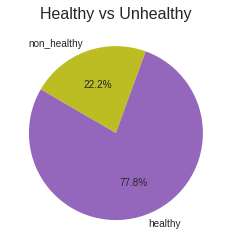

In [ ]:


non_healthy = df_patients[df_patients['Pneumothorax'] == 1].values.shape[0]
healthy = df_patients[df_patients['Pneumothorax'] == 0].values.shape[0]
basic_palette = sns.color_palette()
plt.pie([non_healthy, healthy], labels = ["non_healthy", "healthy"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Healthy vs Unhealthy", fontsize=16)


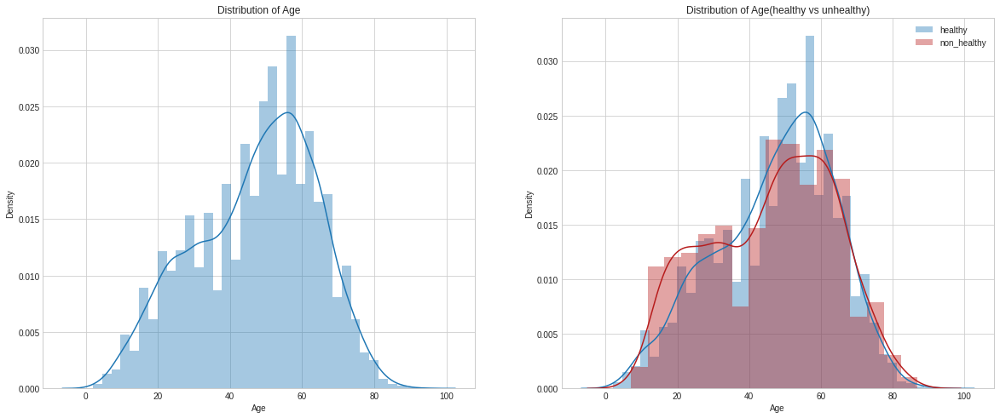

In [ ]:
non_healthy = df_patients[df_patients['Pneumothorax'] == 1] 
healthy = df_patients[df_patients['Pneumothorax'] == 0]

df_patients['Age'] = df_patients['Age'].astype('int') 
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,8))
sns.distplot(df_patients[df_patients['Age']<100]['Age'],ax=axes[0])
axes[0].title.set_text('Distribution of Age')
sns.distplot(healthy[healthy['Age']<100]['Age'],ax=axes[1],label='healthy')
sns.distplot(non_healthy[non_healthy['Age']<100]['Age'],ax=axes[1],color='#B71C1C', label='non_healthy')
axes[1].title.set_text('Distribution of Age(healthy vs unhealthy)')
plt.legend(loc='best') 
plt.show()

Text(0.5, 1.0, 'Occurrences of View positions')

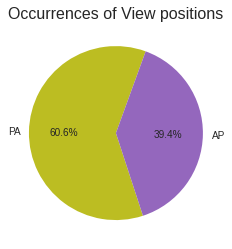

In [ ]:
viewpos = df_patients['ViewPosition'].values

pa =viewpos[viewpos =="PA"].shape[0]
ap= viewpos[viewpos =="AP"].shape[0]

basic_palette = sns.color_palette()
plt.pie([pa, ap], labels = ["PA", "AP"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Occurrences of View positions", fontsize=16)




Text(0.5, 1.0, 'unhealthy by view postion')

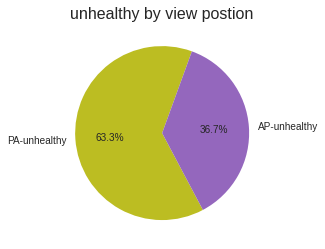

In [ ]:
non_healthy = df_patients[df_patients['Pneumothorax'] == 1]
healthy = df_patients[df_patients['Pneumothorax'] == 0]
paunhealhy = non_healthy[non_healthy["ViewPosition"] =="PA"].shape[0]
apunhealhy = non_healthy[non_healthy["ViewPosition"] =="AP"].shape[0]

plt.pie([paunhealhy, apunhealhy], labels = ["PA-unhealthy", "AP-unhealthy"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("unhealthy by view postion", fontsize=16)

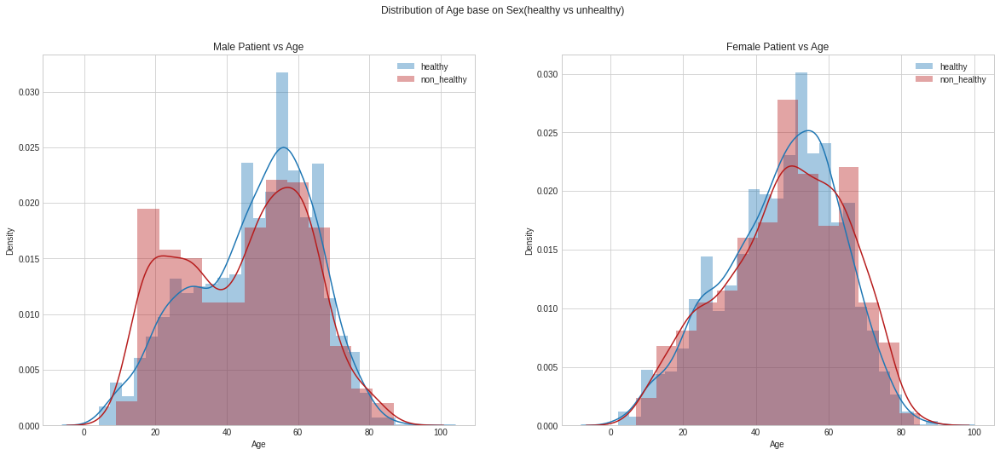

In [ ]:
male = df_patients[df_patients['Sex'] == 'M'] 
female = df_patients[df_patients['Sex'] == 'F'] 

non_healthy_M = male[male['Pneumothorax'] == 1] 
healthy_M = male[male['Pneumothorax'] == 0]
non_healthy_F = female[female['Pneumothorax'] == 1] 
healthy_F = female[female['Pneumothorax'] == 0]
healthy_M=healthy_M[healthy_M['Age']<100]
non_healthy_M=non_healthy_M[non_healthy_M['Age']<100]
healthy_F=healthy_F[healthy_F['Age']<100]
non_healthy_F=non_healthy_F[non_healthy_F['Age']<100]


fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,8))
sns.distplot(healthy_M['Age'],ax=axes[0],label='healthy')
sns.distplot(non_healthy_M['Age'],ax=axes[0],color='#B71C1C',label='non_healthy')
axes[0].set_title('Male Patient vs Age')
axes[0].legend(loc='best') 
sns.distplot(healthy_F['Age'],ax=axes[1], label='healthy')
sns.distplot(non_healthy_F['Age'],ax=axes[1],color='#B71C1C',label='non_healthy')
axes[1].set_title('Female Patient vs Age')
plt.suptitle(f'Distribution of Age base on Sex(healthy vs unhealthy)')
axes[1].legend(loc='best') 
plt.show()



In [ ]:

def rles2mask(rles, width, height):
    """
    
    rle encoding if images
    input: rles(list of rle), width and height of image
    returns: mask of shape (width,height)
    """
    
    mask= np.zeros(width* height)
    for rle in rles:
      rle2mask(mask,rle,width,height)

    return mask.reshape(width, height).T


def rle2mask(mask,rle, width, height):
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position+lengths[index]] = 255
        current_position += lengths[index]


def mask2rle(img, width, height):
  rle = []
  lastColor = 0;
  currentPixel = 0;
  runStart = -1;
  runLength = 0;

  for x in range(width):
      for y in range(height):
          currentColor = img[x][y]
          if currentColor != lastColor:
              if currentColor == 255:
                  runStart = currentPixel;
                  runLength = 1;
              else:
                  rle.append(str(runStart));
                  rle.append(str(runLength));
                  runStart = -1;
                  runLength = 0;
                  currentPixel = 0;
          elif runStart > -1:
              runLength += 1
          lastColor = currentColor;
          currentPixel+=1;

  return " ".join(rle)

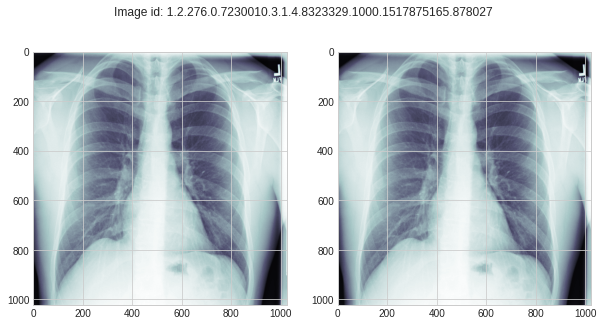

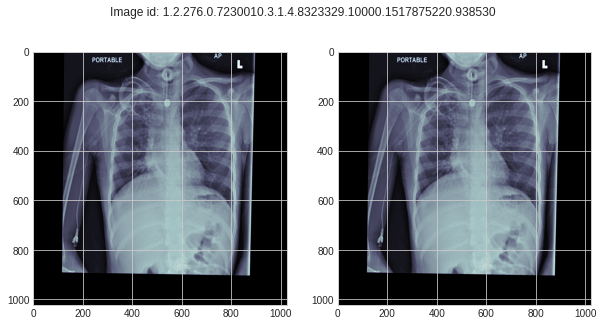

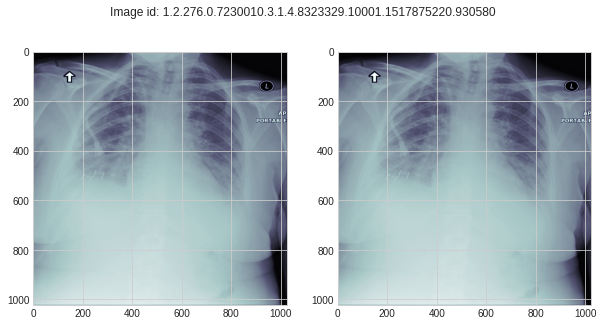

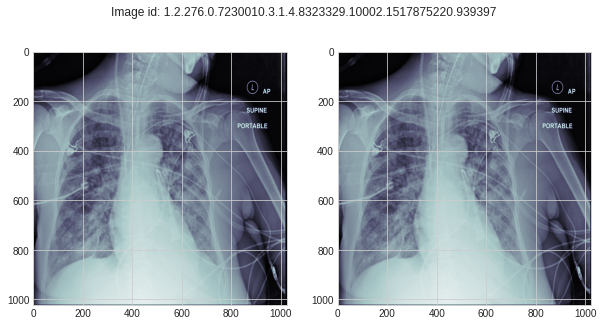

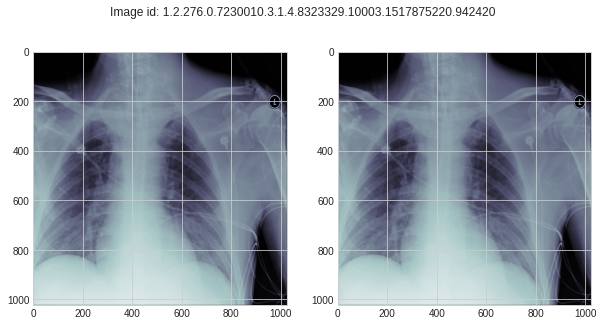

...

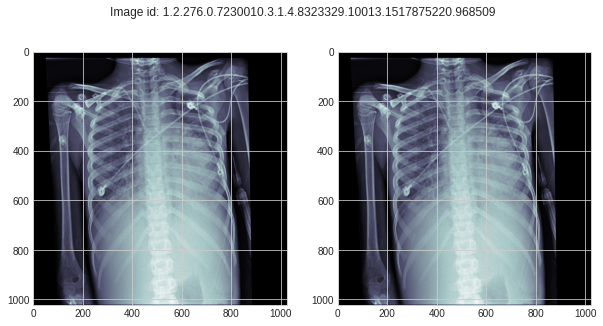

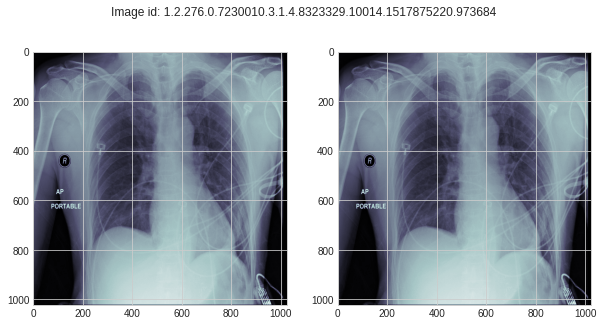

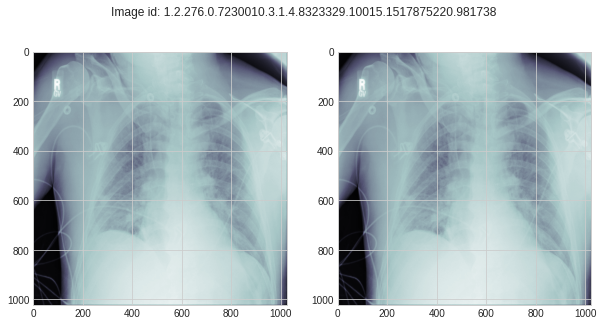

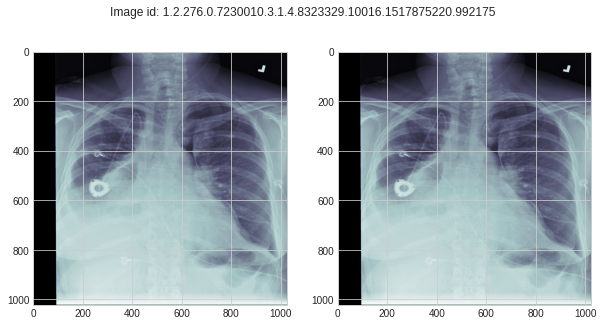

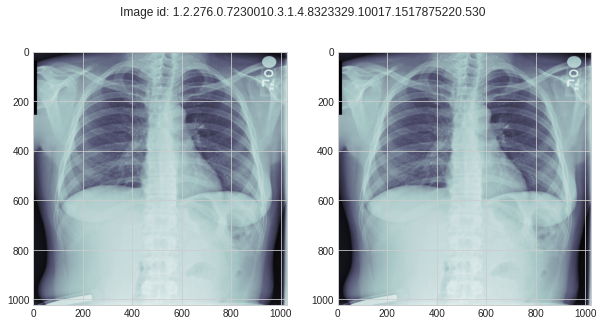

In [ ]:
for file in train_img[0:20]:
    data = pydicom.dcmread(file)
    image = data.pixel_array
    id_ = '.'.join(file.split('/')[-1].split('.')[:-1])
    fig,axes = plt.subplots(1,2,figsize=(10,5))
    axes[0].imshow(image,cmap='bone')
    axes[1].imshow(image,cmap='bone')
    plt.suptitle(f'Image id: {id_}')
    plt.show()



In [11]:
import pydicom,os,cv2
def bounding_box(img):
    rows = np.any(img, axis=1)
    cols = np.any(img, axis=0)
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]
    
    return rmin, cmin, rmax, cmax 


def plot_imgs(n,df):
    for i in range(n):
        idx = np.random.randint(0,df.shape[0])
        tmp = df.iloc[idx]
        path = tmp['filepath']
        encoding = tmp['EncodedPixels']
        image = pydicom.dcmread(path).pixel_array
        fig, axes = plt.subplots(1,4, figsize=(20,15))
        axes[0].imshow(image, cmap='bone')
        axes[0].set_title('Image')
        mask = rles2mask(encoding,image.shape[0],image.shape[1])
        axes[1].imshow(mask,cmap='gray')
        axes[1].set_title('Mask')
        axes[2].imshow(image,cmap='bone')
        axes[2].imshow(mask,alpha=0.3,cmap='Reds')
        axes[2].set_title('Image + mask')
        rmin, cmin, rmax, cmax = bounding_box(mask)
        image_rgb = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
        cv2.rectangle(image_rgb, (cmin,rmin),(cmax,rmax), (255,255,0), 5)
        axes[3].imshow(image_rgb)
        axes[3].imshow(mask,alpha=0.3,cmap='Reds')
        axes[3].set_title('Image Box Annoted')
        plt.show()

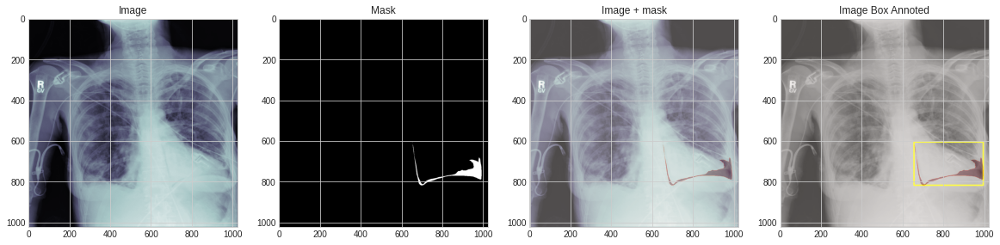

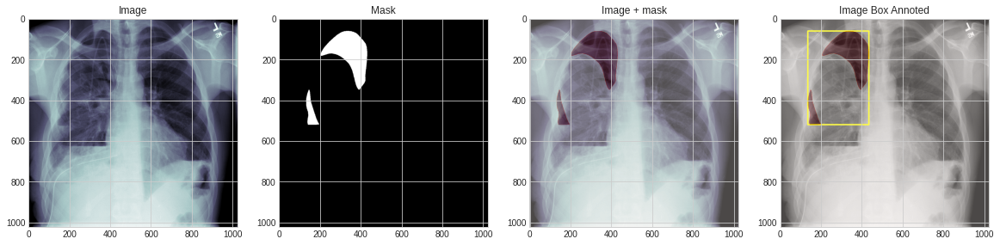

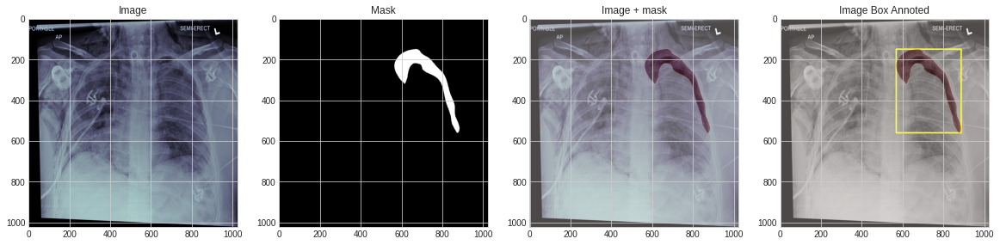

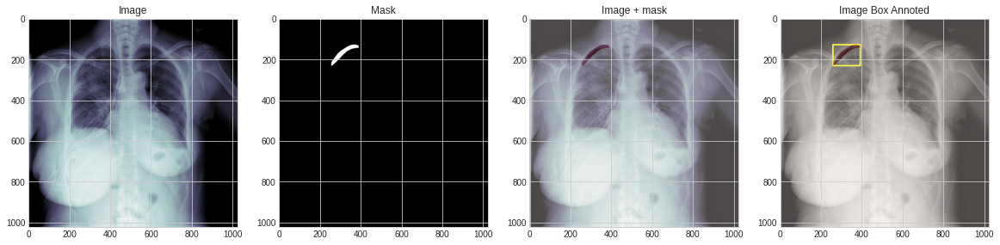

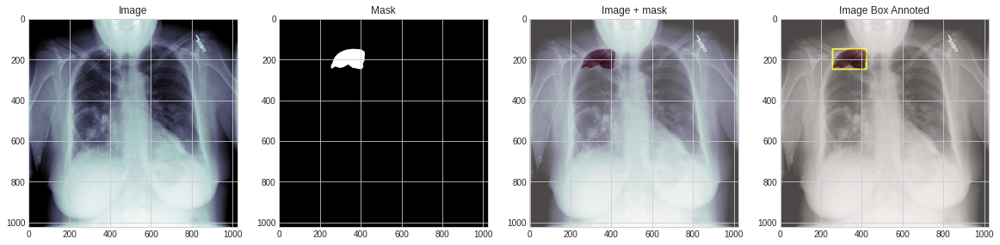

...

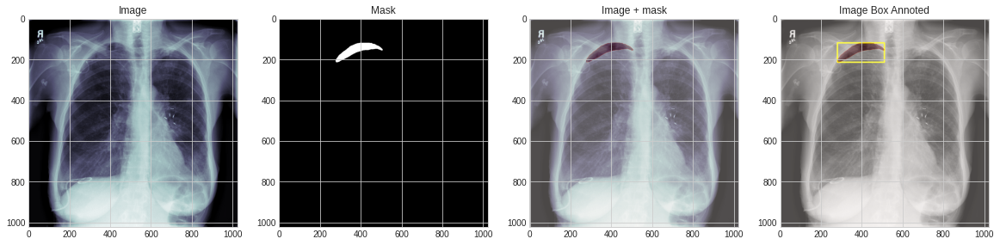

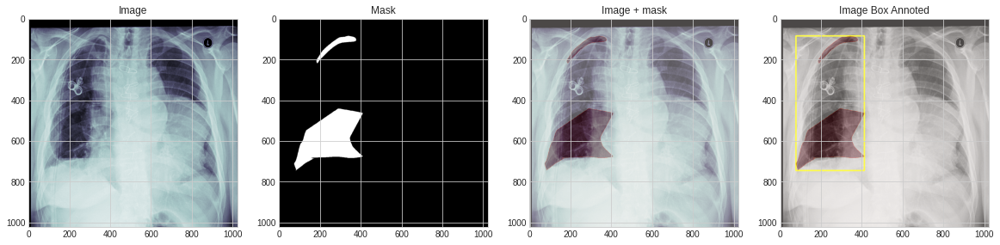

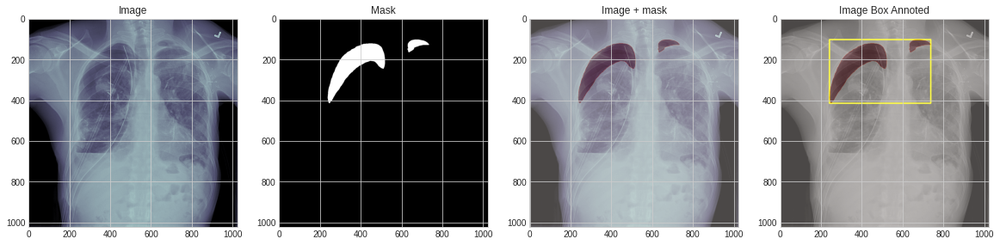

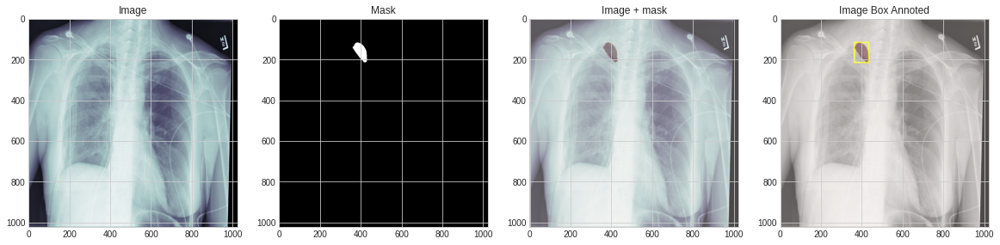

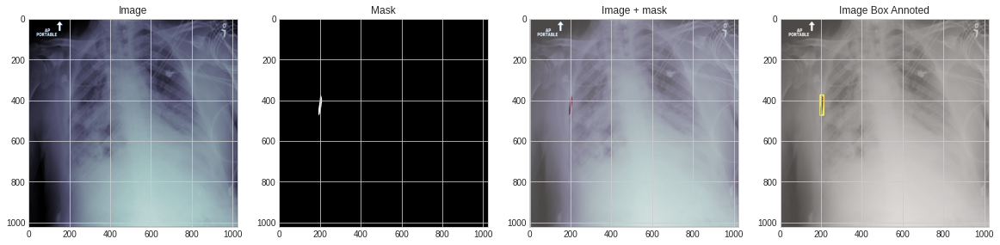

In [ ]:
tmp = df_patients[df_patients['Pneumothorax'] == 1].reset_index(drop=True)
plot_imgs(20,tmp)

**COVID DATA:**
https://www.kaggle.com/competitions/siim-covid19-detection/data

label ==none 1 0 0 1 1 => no findings



Dataset.file_meta -------------------------------
(0002, 0002) Media Storage SOP Class UID         UI: Computed Radiography Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.840.113654.2.70.1.39810146631291240246278118572217078765
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY']
(0008, 0016) SOP Class UID                       UI: 03a65300fa41
(0008, 0018) SOP Instance UID                    UI: 000c3a3f293f
(0008, 0020) Study Date                          DA: 'd09eda152722'
(0008, 0030) Study Time                          TM: '543adb46f494'
(0008, 0050) Accession Number                    SH: '1c2708371bc6'
(0008, 0060) Modality                            CS: 'CR'
(0010, 0010) Patient's Name                      PN: 'ef8c31f8dfdd'
(0010, 0020) P

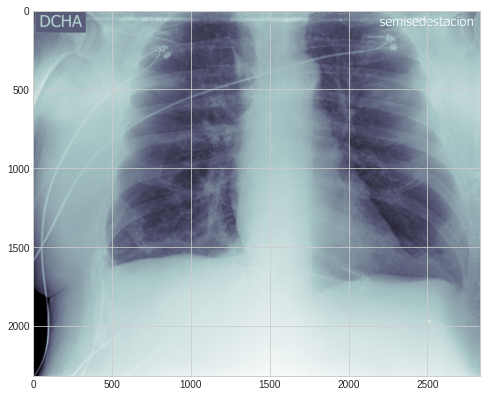

Filename : /content/drive/MyDrive/data/000c3a3f293f.dcm
imege shape (2320, 2832)
Patient id : f09ff9b7dab3
Patient's Sex : M
Modality : CR
Body Part Examined : CHEST


In [2]:
#covid data step3:
import numpy as np 
!pip install pydicom
import pandas as pd 
from glob import glob
from tqdm import tqdm
import pydicom
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-whitegrid')
import warnings
warnings.simplefilter("ignore")
%matplotlib inline
from glob import glob
#train_img = sorted(glob('/content/drive/MyDrive/data/*.dcm'))
train_img = sorted(glob('/content/drive/MyDrive/train/*.dcm'))
df_train_img = pd.read_csv('/content/drive/MyDrive/_image_level.csv')


file_path = train_img[0]
data = pydicom.dcmread(file_path)
print(data)

plt.figure(figsize=(8,8))
plt.imshow(data.pixel_array, cmap=plt.cm.bone)
plt.show()
print("Filename :", file_path)
print("imege shape", data.pixel_array.shape)


print("Patient id :", data.PatientID)
print("Patient's Sex :", data.PatientSex)
print("Modality :", data.Modality)
print("Body Part Examined :", data.BodyPartExamined)


In [3]:




print(f'Number of train files:{len(train_img)}')




missing = 0
multiple = 0
patients_data = []
train_img1= train_img[0:600]
train_img2= train_img[601:650]
train_img3= train_img[651:700]
train_img4= train_img[1000:]


#move on all data
l =[train_img1]
for x in l:
  for k,paths in enumerate(x):
        patient = {}
        data = pydicom.dcmread(paths)
        try:
            image = df_train_img[df_train_img['StudyInstanceUID'] == data.StudyInstanceUID]

            if image.shape[0]==1:
              patient["Findings"] = image['label']
              patient["Name"] = data.PatientName
              patient["StudyInstanceUID"] = data.StudyInstanceUID
              patient['Pixels'] = data.pixel_array
              patient["Sex"] = data.PatientSex
              patient["Modality"] = data.Modality
              patient["BodyPart"] = data.BodyPartExamined
              patient["filepath"] = paths
              patients_data.append(patient)
        except:
          missing += 1

df_patients = pd.DataFrame(patients_data, columns=["Findings","Name","StudyInstanceUID", "Pixels",
                           "Sex", "Modality", "BodyPart", "filepath"])



print("images with labels: ", df_patients.shape[0])












Number of train files:1092
images with labels:  528


[{'x': 623.23328, 'y': 1050, 'width': 714, 'height': 1106}, {'x': 2578.56661, 'y': 998.66667, 'width': 662.66667, 'height': 1120}]


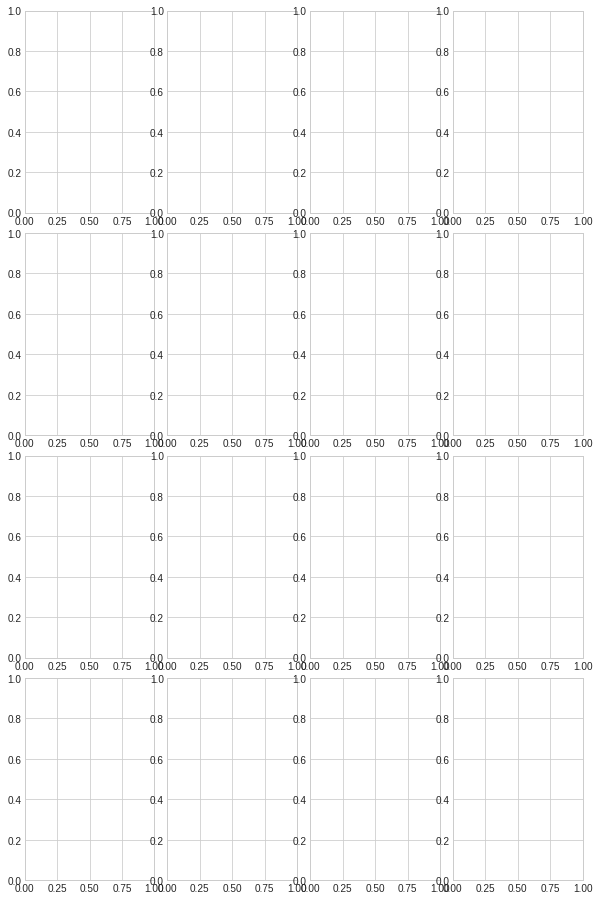

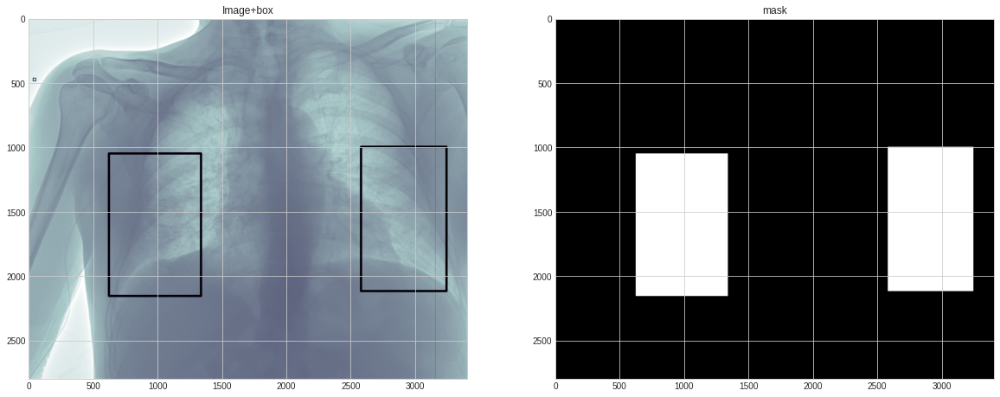

[{'x': 3153.44265, 'y': 1662.61333, 'width': 994.08018, 'height': 1191.73333}, {'x': 647.89598, 'y': 2023.04, 'width': 1261.49333, 'height': 860.37333}]


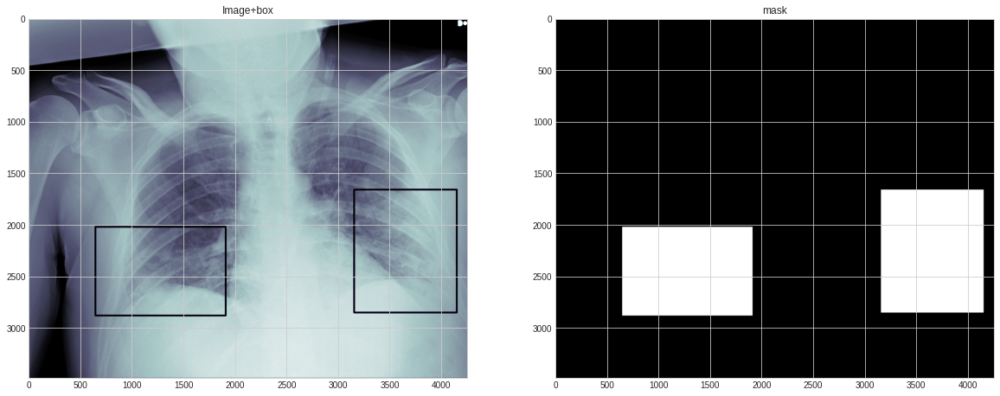

[{'x': 183.16392, 'y': 1514.38554, 'width': 1044.09735, 'height': 787.79468}, {'x': 1912.53449, 'y': 1633.09421, 'width': 798.58606, 'height': 820.16943}]


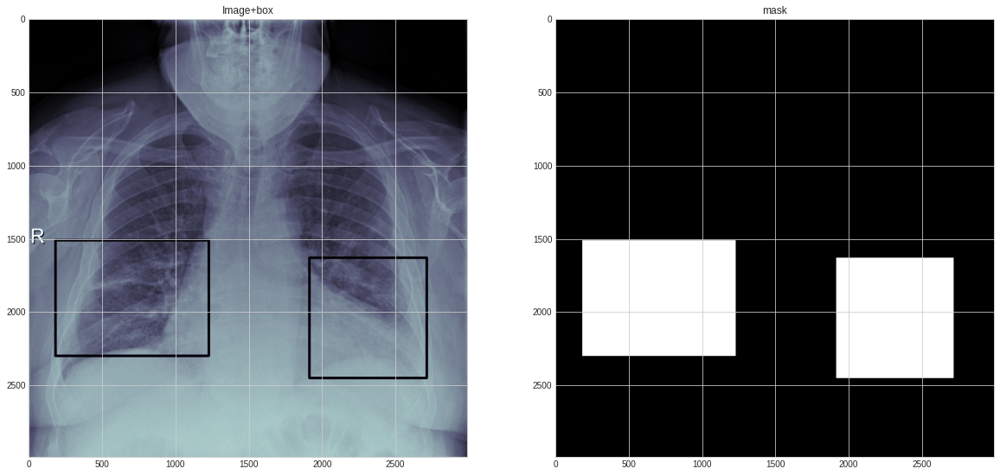

[{'x': 2121.41032, 'y': 837.70208, 'width': 560.71216, 'height': 1139.59595}, {'x': 517.15004, 'y': 692.33211, 'width': 633.39734, 'height': 1383.60968}]


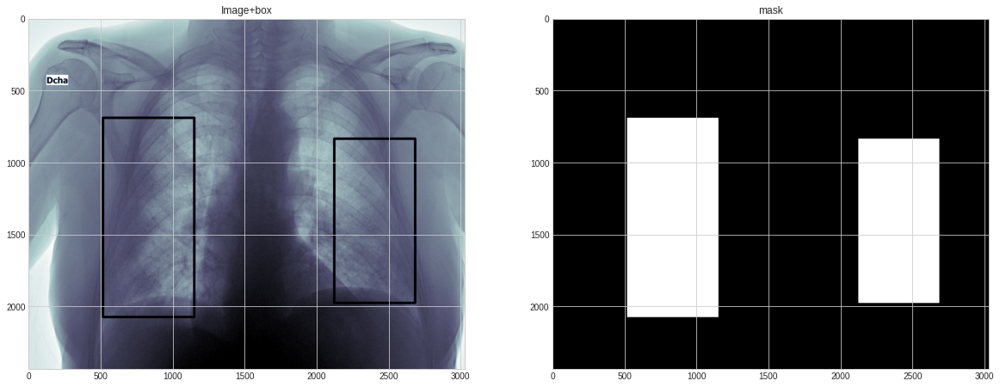

[{'x': 1675.9875, 'y': 96.795, 'width': 952.5775, 'height': 1853.445}, {'x': 446.3325, 'y': 100.38, 'width': 745.68, 'height': 1738.725}]


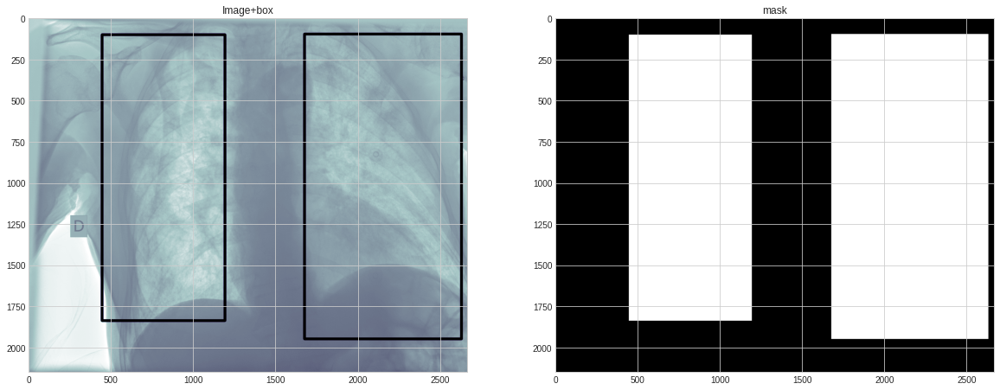

[{'x': 660.37423, 'y': 646.29333, 'width': 626.82667, 'height': 1273.12}, {'x': 1984.10756, 'y': 669.65333, 'width': 673.54667, 'height': 1362.66667}]


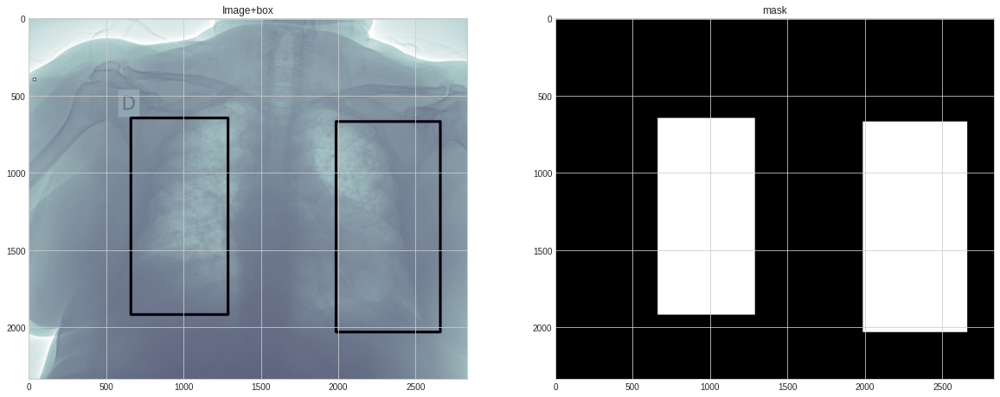

In [24]:
import os
import ast

import math

import pandas as pd
import numpy as np

from tqdm.auto import tqdm

from sklearn.model_selection import StratifiedKFold

import cv2
fig, axs = plt.subplots(4,4,figsize = (10,16))
fig.subplots_adjust(hspace = .1 , wspace = .1)
axs = axs.ravel()
box_list= []
masks= []
for x in df_patients["StudyInstanceUID"].values[0:8]:#move on all data
  example2_meta = df_train_img[df_train_img['StudyInstanceUID'] == x]
  if "none"  not in str(df_patients[df_patients["StudyInstanceUID"]==x]["Findings"].values[0]):
      bbox = example2_meta['boxes'].item()
      print(bbox)
      fig, axes = plt.subplots(1,2, figsize=(20,15))
      img = df_patients.loc[df_patients['StudyInstanceUID'] == x]["Pixels"].values[0]
      for box in ast.literal_eval(bbox):
          x1, y1, x2, y2 = box["x"], box["y"], box["x"] + box["width"], box["y"] + box["height"]
          x1 = int(x1) 
          y1 = int(y1) 
          x2 = int(x2)  
          y2 = int(y2) 
          cv2.rectangle(img, (x1, y1), (x2, y2), (0, 80, 255), 15)
          axes[0].imshow(img, cmap='bone')
          axes[0].set_title('Image+box')
          box_list.append(img)
        

      
      blankimg = np.zeros((img.shape[0],img.shape[1],3), dtype=np.uint8)
      for box in ast.literal_eval(bbox):
          x1, y1, x2, y2 = box["x"], box["y"], box["x"] + box["width"], box["y"] + box["height"]
          x1 = int(x1) 
          y1 = int(y1) 
          x2 = int(x2)  
          y2 = int(y2) 
          cv2.rectangle(blankimg, (x1, y1), (x2, y2), (255, 255, 255), -1)
          masks.append(blankimg)
          axes[1].imshow(blankimg, cmap='bone')
          axes[1].set_title('mask')
      plt.show()







        



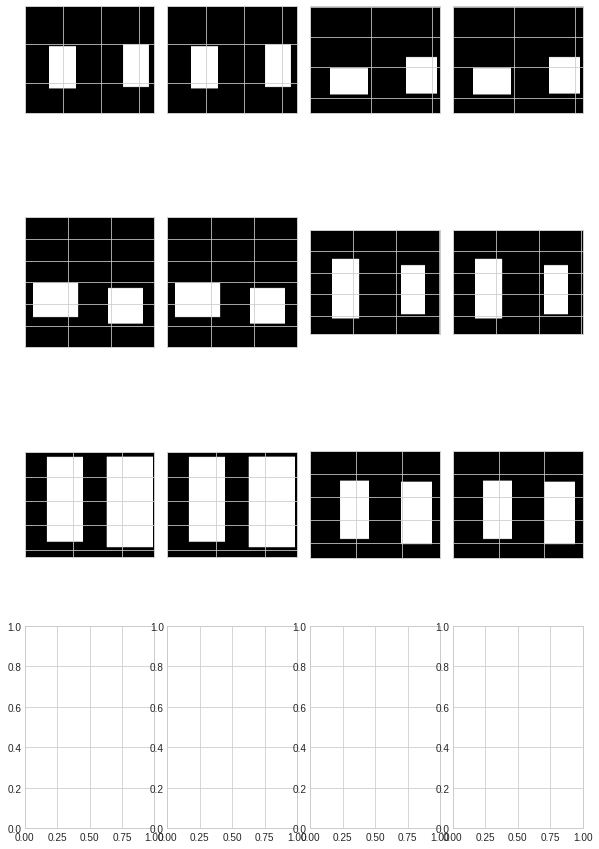

In [6]:
fig, axs = plt.subplots(4,4,figsize = (10,16))
fig.subplots_adjust(hspace = .1 , wspace = .1)
axs = axs.ravel()
for i,l in  enumerate(masks):
    axs[i].imshow(l,cmap = plt.cm.bone)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])

    for i,l in  enumerate(list1):
    axs[i].imshow(l,cmap = "bone")
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])


male number:301
female number:227


Text(0.5, 1.0, 'Male vs Female')

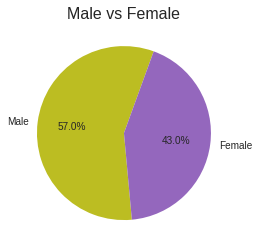

In [7]:
Female =  df_patients[df_patients["Sex"]=='F']
Male = df_patients[df_patients["Sex"]=='M']
print(f"male number:{Male.values.shape[0]}")
print(f"female number:{Female.values.shape[0]}")

basic_palette = sns.color_palette()
plt.pie([Male.values.shape[0], Female.values.shape[0]], labels = ["Male", "Female"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Male vs Female", fontsize=16)





301


Text(0.5, 1.0, 'Male -Healthy vs Unhealthy')

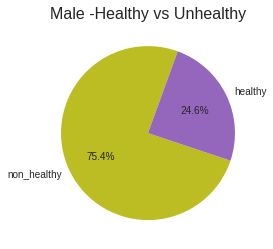

In [8]:
healthy = 0
unhealthy =0

finding = Male["Findings"].values
print(finding.shape[0])
for x in finding:
  if "none" in str(x):
    healthy+=1
  else:
    unhealthy+=1
basic_palette = sns.color_palette()
plt.pie([unhealthy, healthy], labels = ["non_healthy", "healthy"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Male -Healthy vs Unhealthy", fontsize=16)


227


Text(0.5, 1.0, 'Female - Healthy vs Unhealthy')

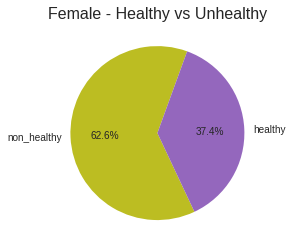

In [9]:
healthy = 0
unhealthy =0

finding = Female["Findings"].values
print(finding.shape[0])
for x in finding:
  if "none" in str(x):
    healthy+=1
  else:
    unhealthy+=1
basic_palette = sns.color_palette()
plt.pie([unhealthy, healthy], labels = ["non_healthy", "healthy"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Female - Healthy vs Unhealthy", fontsize=16)


unhealty number is:369
healty number is:159


Text(0.5, 1.0, 'Healthy vs Unhealthy')

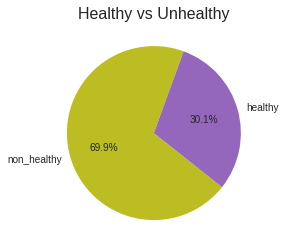

In [10]:

import pandas as pd 

healthy = 0
unhealthy =0

finding = df_patients["Findings"].values
for x in finding:
  if "none" in str(x):
    healthy+=1
  else:
    unhealthy+=1





print(f"unhealty number is:{unhealthy}")
print(f"healty number is:{healthy}")

basic_palette = sns.color_palette()
plt.pie([unhealthy, healthy], labels = ["non_healthy", "healthy"], colors=[basic_palette[-2], basic_palette[4]], autopct='%1.1f%%', startangle=70)
plt.title("Healthy vs Unhealthy", fontsize=16)



